# Welcome to nameGen a generative AI based on a probabilistic Graph

This notebook walks you through the creation of the name generator and presents the logic behind its functionality.

This project's goal is to generate names that sound as if they could have been real names but most, not all, are new names generated by the AI.

In the original makemore, Andrej Karpathy looks at the probability that any combination of two letters (bigrams) occur in a name. 
For example my name, Hernan, would be separated in the follwing bigrams: *H, he, er, rn, na, an, n~, using * as a marker to start the word and ~ as a marker to end the word.

This approach doesn't seem very effective because it underestimates the fact that it's not the same to get "er" on different positions of a name, for example:

* Eric, Erin, Erik, Erica, Erika, Erick, Ernesto  have er as the first two letters but
* Hermes, Hermman, Berenice, Derrick have "er" on the second and third position. 

By looking at those examples I wondered if the next letter depends on the position a bigram such as "er" takes in a name.

I decided to try a graph to capture the probability of a letter in any a specific position to have any other letter as the following character of the name. This gives the name generator more information about the way humans create names making it better at guessiong names that sounds acceptable.  

Finally, this code is all my own and I didn't use any existing model to train it or develop it. I'm sure this may be similar to the existing theory about probabilistic graph but I didn't take this code or any ideas from any repository or guide. 

# Let's get started by importing our libraries:
* networkx will help us build the graph
* Torch will provide a multinomial sampler that allows us to get the probability of a letter to be followed by another letter on each position of a name
* pickle helps to persist the graph in case we wanted to save it
* nameGenfuncs are all the functions that create the graph and assign its associated probabilities

In [1]:
import torch
import networkx as nx
import sys
import pickle
from nameGenfuncs import *
import matplotlib.pyplot as plt

Here we will create the graph and sample one name by calling our makemore function:
1. Load the data
```python
words=load_data(fpath+'names.txt')
```
2. Create a list of all the possible characters in our data
```python
allchrs=getallchars(words)
```
3. Create padding for the words to make them as if they had the same length. This is a commonly used technique in deep learning for images 
```python
new_words=padding(words)
```
4. Train our model by creating a graph
```python
DG=bigramgraph(allchrs,new_words)
```
5. Create a torch generator to sample a multinomial probability function associated with the transition probabilities between each letter
```python
g = torch.Generator().manual_seed(torch.randint(0, 10000000000, (1,)).item())
```
6. Generate a name
```python
makemore(allchrs,g, DG)
```

In [2]:
fpath="./auxiliary/"
words=load_data(fpath+'names.txt')
allchrs=getallchars(words)
new_words=padding(words)
DG=bigramgraph(allchrs,new_words)
g = torch.Generator().manual_seed(torch.randint(0, 10000000000, (1,)).item())
makemore(allchrs,g, DG)

'aronto'

# Let's draw our graph
In the graph generated by the following code each node represents a letter in a particular position, and the edges the probability to go to the next letter. We will show more detail below.

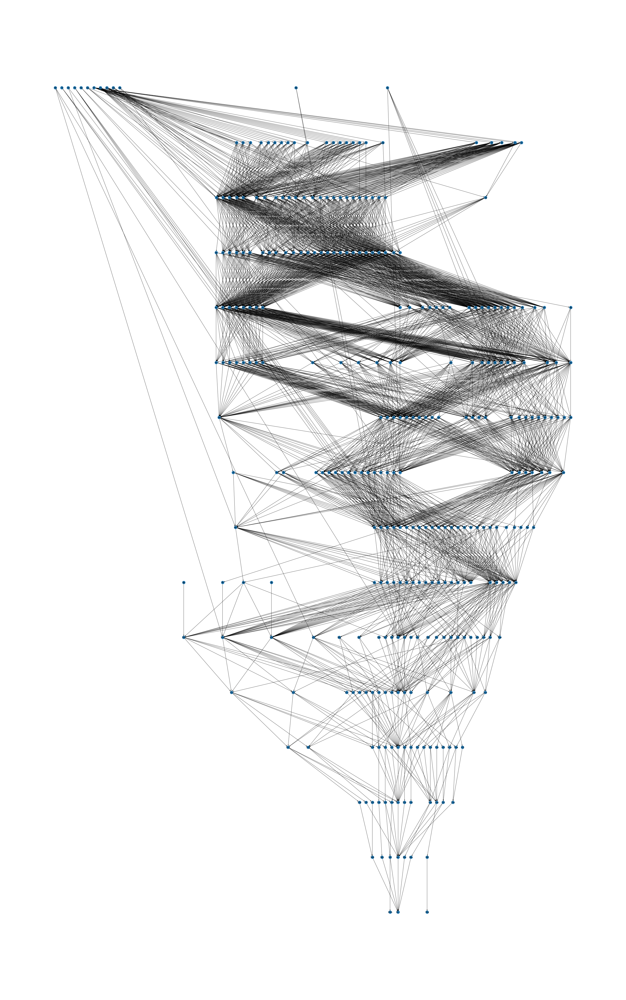

In [3]:
from networkx.drawing.nx_pydot import graphviz_layout
pos = nx.nx_agraph.graphviz_layout(DG, prog="dot")
fig=plt.figure(figsize=(50,80), dpi= 60)
nx.draw(DG, pos,with_labels = True,node_size = 300,font_size=12)
plt.savefig("nxGraph.png",bbox_inches="tight")
plt.show()

The next code saves the graph in case you want to explore it with [Gephi](https://gephi.org/) a powerful graph visualization tool

In [15]:
nx.write_gexf(DG, "DG.gexf")

# Gephi rendered graph

<img src="GephiGraph.png" width=1200 height=600 />

# Diving into the graph
Now let's just focus on one name, mine, Hernan. We will create a subgraph with my name to see the simple path it takes. A couple of interesting points:
1. The probability to start a name with h is very low, only 0.03
2. Going from r on the 3rd position to an n in the 4th position is also very rare, 0.02 probability
3. Going from an n in the 6th position to the ending character was very likely 0.59

These observations make sense because the names used were mostly English names and my name is Spanish, also when names get long the algorithm tends to get higher probabilities to end, because names are rarely very long in the US.  

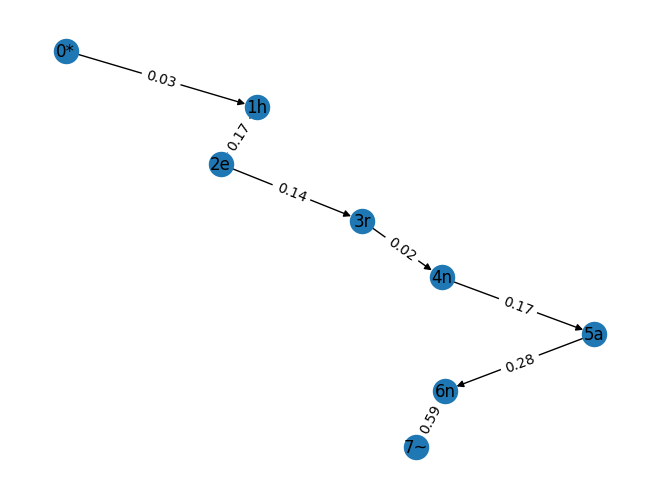

In [5]:
ME = DG.subgraph(['0*', '1h', '2e','3r','4n','5a','6n','7~'])
labels = nx.get_edge_attributes(ME,'weight')
nx.draw(ME, pos, with_labels = True)
nx.draw_networkx_edge_labels(ME,pos,edge_labels=labels)
plt.show()

# Initial probabilities
Now let's take a look at the begining of the graph, the transition from the starting word marker * to the first letter, a few things to note are:
1. Highest probability for a letter to begin a name are: k, j and m
2. Lowest probabilities t begin a name are: w,o,f,v

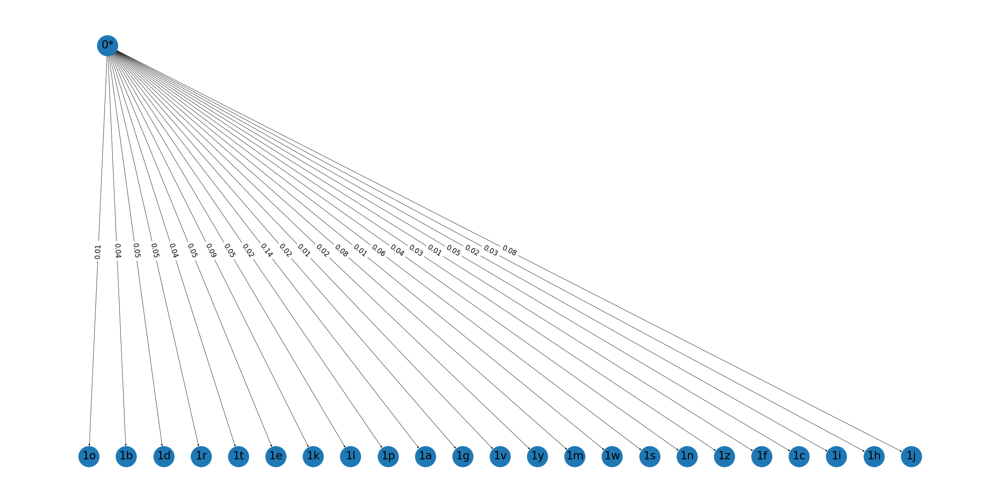

In [6]:
G0=list(DG.neighbors('0*'))#[n for n in G.neighbors(0)]
G0.append('0*')
G0=DG.subgraph(G0)    
labels = nx.get_edge_attributes(G0,'weight')
pos = nx.nx_agraph.graphviz_layout(G0, prog="dot")
fig=plt.figure(figsize=(40,20), dpi= 60)
nx.draw(G0, pos, with_labels = True,node_size = 3600,font_size=32)
nx.draw_networkx_edge_labels(G0,pos,edge_labels=labels,font_size=20)
plt.show()

# Track Hernan through the Graph
Now let's follow my name, through the graph including possible alternatives at each step of the way. An interesting point to note is that 
once h is determined to be the first letter, the group of possible next letters is smaller than the entire alphabet. This occurs because the graph only tracks routes that have been seen in the training data. If a letter doesn't follow h in the first position in the trainig data then the graph won't incorporate it as a possibility. 

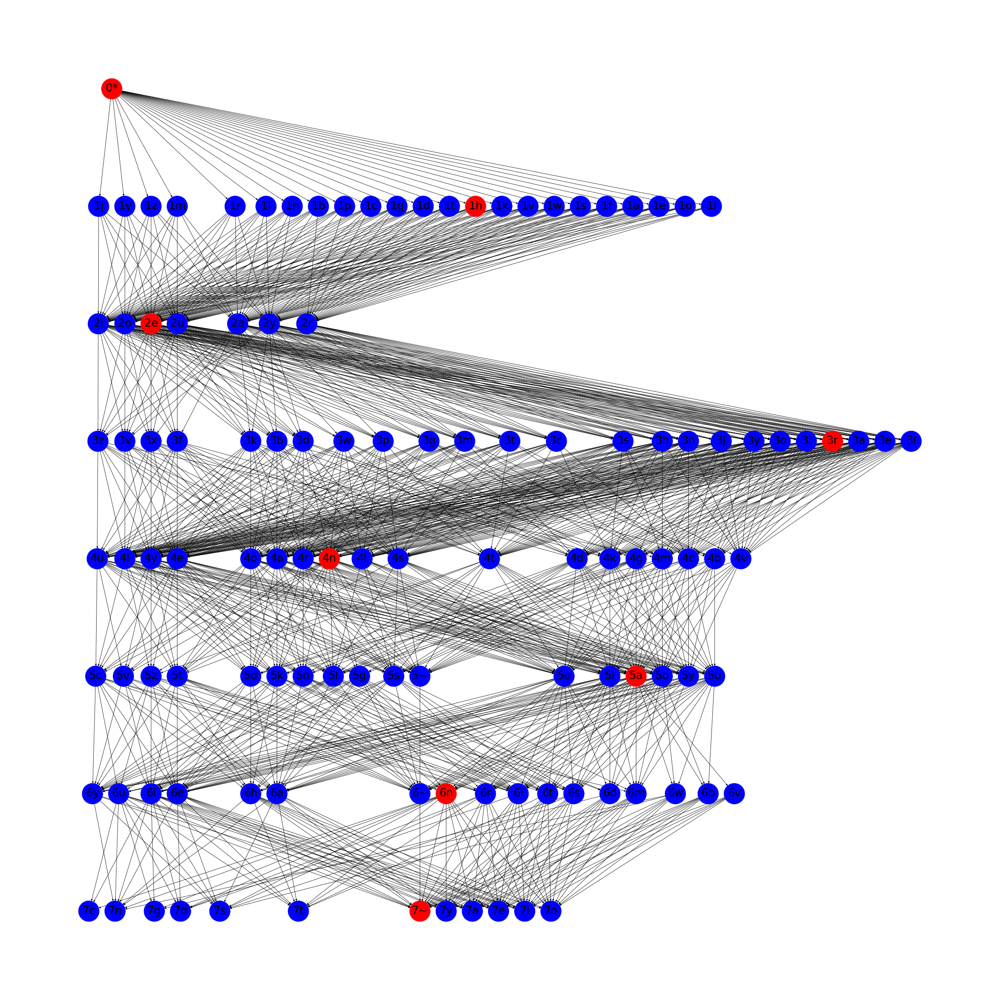

In [14]:
hmlist=['0*', '1h', '2e','3r','4n','5a','6n','7~']
MElist=list()
for char in hmlist:
    if not char=='7~':
        MElist.extend(list(DG.neighbors(char)))
    MElist.append('0*')

ME=DG.subgraph(MElist)
color_map = []

for node in ME:
    if node in hmlist:
        color_map.append('red')
    else: 
        color_map.append('blue') 

pos = nx.nx_agraph.graphviz_layout(ME, prog="dot")
fig=plt.figure(figsize=(40,40), dpi= 60)
nx.draw(ME, pos, with_labels = True,node_color=color_map, node_size = 3600,font_size=32)
plt.show()